# Investigating the 1.2M data set

Get distribution of file sizes from here: https://superuser.com/questions/565443/generate-distribution-of-file-sizes-from-the-command-prompt

In [5]:
# !find ../images-legacy -type f -print0 | xargs -0 ls -l | awk '{size[int(log($5)/log(2))]++}END{for (i in size) printf("%10d %3d\n", 2^i, size[i])}' | sort -n

```
         0 515
      2048  18
      4096 3636
      8192 704287
     16384  12
     65536   1
    524288 508700
   1048576   1
```

Clearly there are >700k below 16kB and >500k above 500kB. Great.

In [7]:
import os
from pathlib import Path

image_path = Path('../images-legacy').resolve()

filenames = list(x for x in image_path.rglob('*.jpg') if x.is_file() and os.path.getsize(x) >= 16384)

In [8]:
len(filenames)

508714

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [28]:
df = pd.read_csv('../data/xSAGA_SDSS_mini.csv', index_col=0)
df.index = df.index.map(str)
df.head()

/opt/anaconda3/envs/fastai2/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


,ra,dec,g0,r0,R_eff
objID,,,,,
1237651065727812002,127.797290,48.628730,19.85899,19.34029,2.977370
1237651065727222050,126.476999,47.572385,18.91683,18.45553,2.509181
1237651065727353307,126.806353,47.839850,21.29110,20.73459,0.965592
1237651065726828983,125.654834,46.885250,21.13659,20.52898,1.897469
1237651066265141613,128.415568,49.743235,19.29111,19.00043,1.607189


In [43]:
objIDs = list(x.stem for x in filenames)

# valid df
vdf = df.loc[objIDs]

In [44]:
len(vdf)

508714

In [45]:
vdf.sample(5)

,ra,dec,g0,r0,R_eff
objID,,,,,
1237665128551743529,206.507510,33.168747,21.46009,20.92978,1.796524
1237667441897439617,185.334572,26.648958,20.53737,20.08704,2.390905
1237667783384105241,215.618602,20.164059,20.05433,19.62549,2.104267
1237665025979646466,187.286380,35.733982,19.69106,19.13347,2.901025
1237667538008867670,153.643297,21.819320,21.06250,20.58125,1.206356


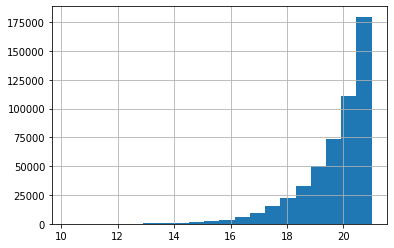

In [47]:
vdf.r0.hist(bins=20)

In [41]:
import cmasher as cmr

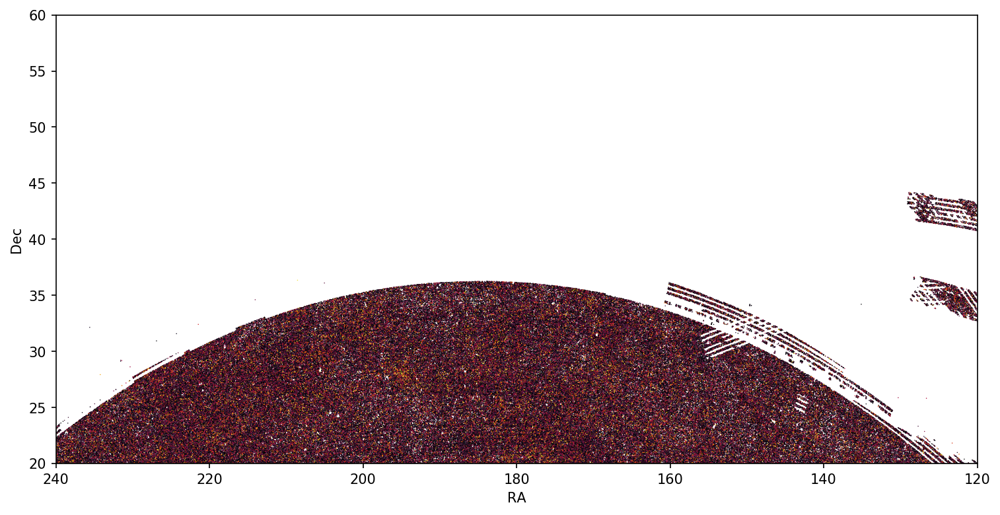

In [50]:
plt.figure(figsize=(12, 6), dpi=150)
plt.scatter(vdf.ra, vdf.dec, c=vdf.r0, edgecolor='none', s=0.5, label='xSAGA', cmap='cmr.ember_r', vmin=16, vmax=21)
plt.xlim(240, 120)
plt.ylim(20, 60)

plt.xlabel('RA')
plt.ylabel('Dec');

# Super small subsample

In [51]:
# small subset of valid df, `vdf`
sdf = vdf[(vdf.ra < 220) & (vdf.ra > 160) & (vdf.dec > 20) & (vdf.dec < 30)]

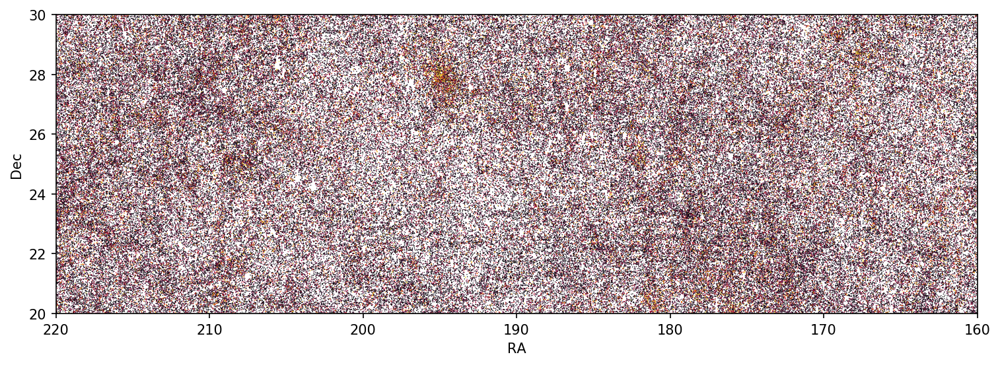

In [52]:
plt.figure(figsize=(12, 4), dpi=150)
plt.scatter(sdf.ra, sdf.dec, c=sdf.r0, edgecolor='none', s=0.5, label='xSAGA', cmap='cmr.ember_r', vmin=16, vmax=21)
plt.xlim(220, 160)
plt.ylim(20, 30)

plt.xlabel('RA')
plt.ylabel('Dec');

In [53]:
len(sdf)

242095

# Grab an extremely small data set and test

In [54]:
from fastai2.basics import *
from fastai2.vision.all import *

In [99]:
xdf = df[(df.ra < 160) & (df.ra > 157) & (df.dec > 20) & (df.dec < 21)]
len(xdf)

1157

In [56]:
model = xse_resnext18(n_out=2, sa=True, act_cls=Mish)
model.load_state_dict(torch.load(
    f'../models/SAGA-legacy-xse_xresnet18.pth', 
    map_location=torch.device('cpu')
))
m = model.eval()

In [100]:
legacy_image_stats = [np.array([0.14814416, 0.14217226, 0.13984123]), np.array([0.0881476 , 0.07823102, 0.07676626])]

item_tfms = [Resize(224)]
batch_tfms = (
    aug_transforms(max_zoom=1., flip_vert=True, max_lighting=0., max_warp=0.) + 
    [Normalize.from_stats(*legacy_image_stats)]
)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_x=ColReader(['objID'], pref=f'../images-legacy/', suff='.jpg'),
    get_y=ColReader(['r0']),          # filler variable --
    splitter=RandomSplitter(0),
    item_tfms=item_tfms,
    batch_tfms=batch_tfms,
)

In [101]:
xdf.reset_index(inplace=True)
xdf.sample(3)

,objID,ra,dec,g0,r0,R_eff
605,1237667782287163563,158.867820,20.011243,18.04399,17.53409,2.146891
235,1237667735034921411,158.495734,20.291668,20.72415,20.09420,1.933545
431,1237667735571923301,158.728339,20.751189,21.48753,20.98094,1.022117


In [102]:
dblock.summary(xdf)

Setting-up type transforms pipelines
0     1237667734498640291  159.990288  20.038030  21.21759  20.65698  2.274098
1     1237667734498509037  159.752959  20.082569  19.23232  18.83903  4.645856
2     1237667734498509088  159.680809  20.048903  20.36004  20.04023  1.510147
3     1237667734498509107  159.732359  20.084256  20.52062  20.09591  1.364471
4     1237667734498508842  159.667992  20.070470  20.14329  19.56742  1.482142
...                   ...         ...        ...       ...       ...       ...
1152  1237667783361298994  159.653991  20.997263  21.05128  20.56875  2.405838
1153  1237667783897186692  157.150674  20.972396  21.25737  20.75896  1.335552
1154  1237667783897186774  157.192464  20.982371  20.59874  20.04841  1.376770
1155  1237667783897186572  157.229399  20.982915  19.86039  19.35816  1.979782
1156  1237667783897252177  157.267169  20.994789  21.11660  20.59505  1.111693

[1157 rows x 6 columns]
Found 1157 items
2 datasets of sizes 1157,0
Setting up Pipeline: ColR

OSError: cannot find loader for this FITS file

In [93]:
dls = ImageDataLoaders.from_dblock(dblock, xdf, bs=128)

OSError: cannot find loader for this FITS file

In [103]:
PILImage.create('../images-legacy/1237667911668924521.jpg')

OSError: cannot find loader for this FITS file

## Wait a second... are these supposed to be FITS files that LegacySurvey decided to save as JPGs??? They're huge (600kB)!

In [105]:
!ls -ltr '../images-legacy/1237667911668924521.jpg'

-rw-r--r-- 1 jupyter jupyter 607680 Jan 15 16:35 ../images-legacy/1237667911668924521.jpg


In [107]:
from astropy.io import fits
with fits.open('../images-legacy/1237667911668924521.jpg') as hdulist:
    hdulist.info()

Filename: ../images-legacy/1237667911668924521.jpg
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      25   (224, 224, 3)   float32   


# Okay, retry, but let's use the ones that are like 6kB - 16kB

In [109]:
filenames = list(x for x in image_path.rglob('*.jpg') if x.is_file() and (os.path.getsize(x) < 16384) and (os.path.getsize(x) >= 6000))
len(filenames)

707747

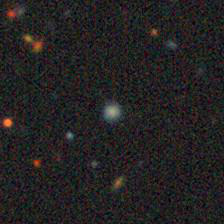

In [115]:
# verify that these actually work
PILImage.create(filenames[42])

In [110]:
objIDs = list(x.stem for x in filenames)


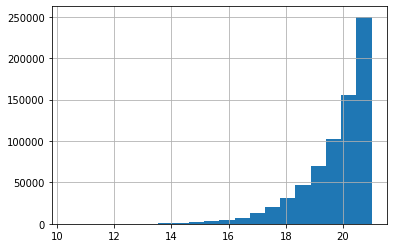

In [118]:
# actual valid dfs
vdf = df.loc[objIDs]
vdf.r0.hist(bins=20)

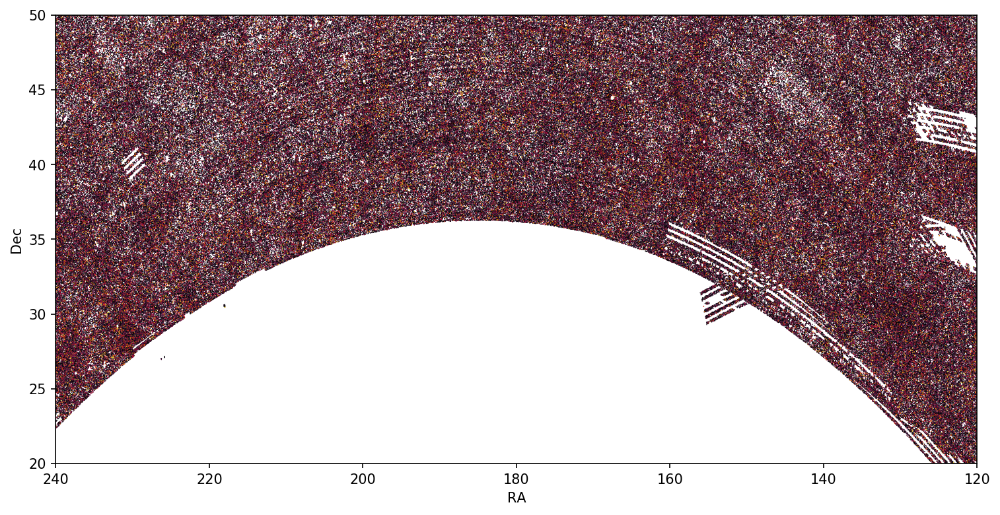

In [120]:
plt.figure(figsize=(12, 6), dpi=150)
plt.scatter(vdf.ra, vdf.dec, c=vdf.r0, edgecolor='none', s=0.5, label='xSAGA', cmap='cmr.ember_r', vmin=16, vmax=21)
plt.xlim(240, 120)
plt.ylim(20, 50)

plt.xlabel('RA')
plt.ylabel('Dec');

In [121]:
from fastai2.basics import *
from fastai2.vision.all import *

In [122]:
model = xse_resnext18(n_out=2, sa=True, act_cls=Mish)
model.load_state_dict(torch.load(
    f'../models/SAGA-legacy-xse_xresnet18.pth', 
    map_location=torch.device('cpu')
))
m = model.eval()

In [123]:
legacy_image_stats = [np.array([0.14814416, 0.14217226, 0.13984123]), np.array([0.0881476 , 0.07823102, 0.07676626])]

item_tfms = [Resize(224)]
batch_tfms = (
    aug_transforms(max_zoom=1., flip_vert=True, max_lighting=0., max_warp=0.) + 
    [Normalize.from_stats(*legacy_image_stats)]
)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_x=ColReader(['objID'], pref=f'../images-legacy/', suff='.jpg'),
    get_y=ColReader(['r0']),          # filler variable --
    splitter=RandomSplitter(0),
    item_tfms=item_tfms,
    batch_tfms=batch_tfms,
)

In [124]:
dls = ImageDataLoaders.from_dblock(dblock, vdf.reset_index(), bs=128)

In [130]:
learn = Learner(dls, m, )

In [131]:
test_dl = dls.test_dl(filenames)
test_dl.bs = 128                     # 512 uses 12GB of RAM and is bottlenecked by GPU load times.
#                                      128 is continuous and seems to go 3x faster

In [133]:
# > 30 min...
preds = learn.get_preds(dl=test_dl)

In [170]:
prediction_df = vdf.copy()
prediction_df['p_sat'] = preds[0][:, 1]

prediction_df.to_csv(f'../results/predictions-initial.csv', index=True)

# Visualize results

In [135]:
# shortcut
pdf = prediction_df

len(pdf), sum(pdf.p_sat > 0.5), sum(pdf.p_sat > 0.8), sum(pdf.p_sat > 0.9)

(707747, 9231, 7977, 6971)

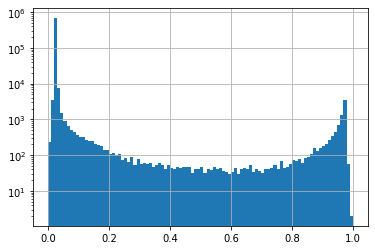

In [154]:
pdf.p_sat.hist(bins=100, log=True)

In [136]:
pdf_sat = pdf[pdf.p_sat > 0.5]

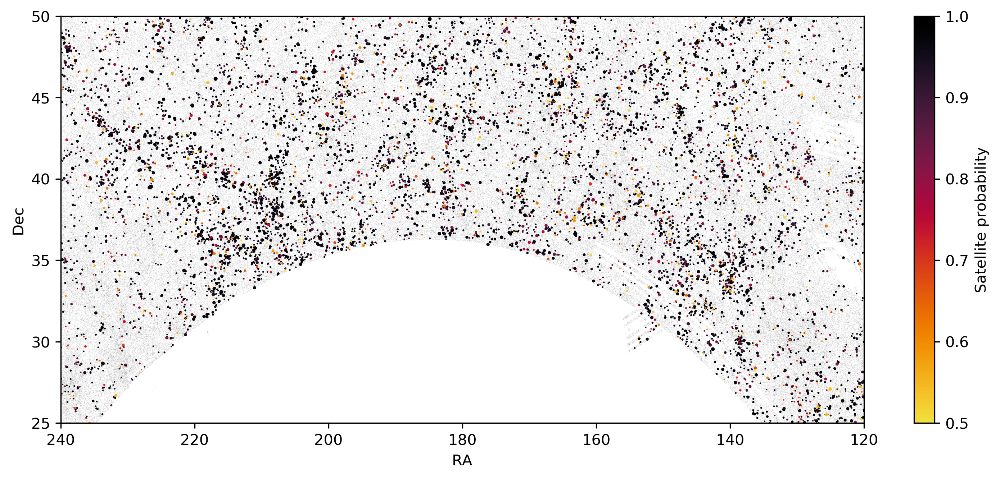

In [192]:
plt.figure(figsize=(12, 5), dpi=300)
plt.scatter(vdf.ra, vdf.dec, edgecolor='none', s=0.1, label='xSAGA', c='k', alpha=0.1)

sc = plt.scatter(pdf_sat.ra, pdf_sat.dec, c=pdf_sat.p_sat, edgecolor='none', s=(pdf_sat.r0/20)**-4, label='xSAGA', cmap='cmr.ember_r', vmin=0.5, vmax=1.)

plt.colorbar(sc, label='Satellite probability')

plt.xlim(240, 120)
plt.ylim(25, 50)

plt.xlabel('RA')
plt.ylabel('Dec');

1237661360230695105    p_sat = 0.754
     RA = 220.94553    Dec = 40.26268


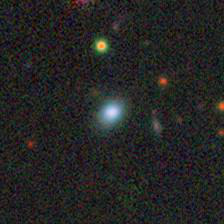

1237662194534121938    p_sat = 0.974
     RA = 207.91863    Dec = 40.14912


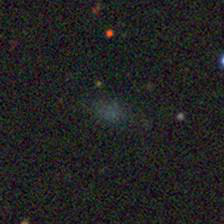

1237664869751587173    p_sat = 0.957
     RA = 146.04903    Dec = 32.09426


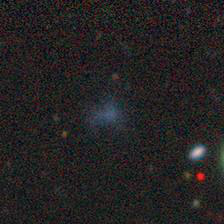

1237664667366588442    p_sat = 0.974
     RA = 169.63367    Dec = 37.94831


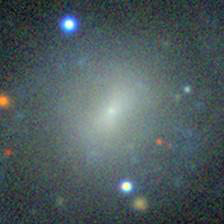

1237662195612582034    p_sat = 0.612
     RA = 221.28126    Dec = 37.20802


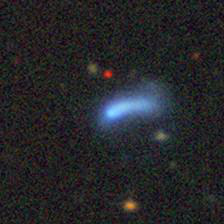

1237664294222889502    p_sat = 0.788
     RA = 203.20196    Dec = 38.04894


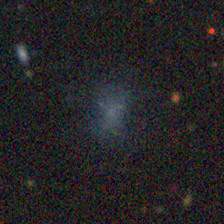

1237664877801832715    p_sat = 0.935
     RA = 141.27267    Dec = 28.04923


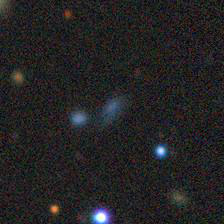

1237659161195249869    p_sat = 0.950
     RA = 225.98565    Dec = 48.43015


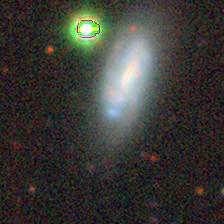

1237662195070927245    p_sat = 0.975
     RA = 207.85936    Dec = 40.58622


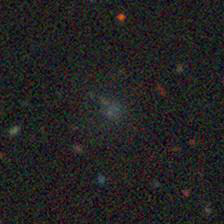

1237661136890102024    p_sat = 0.846
     RA = 164.82124    Dec = 39.74377


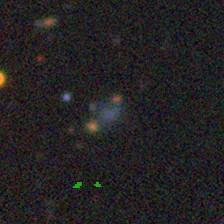

In [178]:
for row in pdf_sat.sample(10).itertuples():
    print(row.Index + f'    p_sat = {row.p_sat:.3f}\n     RA = {row.ra:.5f}    Dec = {row.dec:.5f}')
    display(PILImage.create(f'../images-legacy/{row.Index}.jpg'))